# 1. Data Describtion

## Columns
* `image_name` - unique identifier, points to filename of related DICOM image
* `patient_id` - unique patient identifier
* `sex` - the sex of the patient (when unknown, will be blank)
* `age_approx` - approximate patient age at time of imaging
* `anatom_site_general_challenge` - location of imaged site
* `diagnosis` - detailed diagnosis information (train only)
* `benign_malignant` - indicator of malignancy of imaged lesion
* `target` - binarized version of the target variable

## Images
* DICOM ---> `.dcm`
* JPEG ---> `.jpg`

# 2. Notebook Preparation for Code

## Libraries

In [1]:
# !pip install --upgrade tensorflow
# !pip install tensorflow-addons

In [2]:
!pip install -q efficientnet

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.1 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


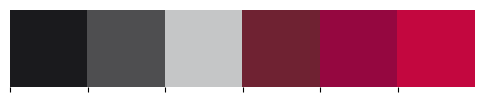

In [3]:
import os, os.path
import re
import numpy as np
import pandas as pd
import random
import math
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import seaborn as sns

from sklearn import metrics
from sklearn.model_selection import KFold, StratifiedKFold, GroupKFold
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
from sklearn import preprocessing

import tensorflow as tf
from kaggle_datasets import KaggleDatasets
import efficientnet.tfkeras as efn
import dill
from tensorflow.keras import backend as K

from PIL import Image
import gc
import cv2
import time
import datetime

import pydicom # for DICOM images
from skimage.transform import resize

import torch
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision.transforms as transforms
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch import FloatTensor, LongTensor

from albumentations import (ToFloat, Normalize, VerticalFlip, HorizontalFlip, Compose, Resize,
                            RandomBrightnessContrast, HueSaturationValue, Blur, GaussNoise,
                            Rotate, RandomResizedCrop, ShiftScaleRotate)

# from albumentations.pytorch import ToTensorV2, ToTensor

import keras
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np
import cv2
import math
from sklearn.metrics import confusion_matrix , classification_report
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, MaxPool2D
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array, array_to_img
from sklearn.metrics import ConfusionMatrixDisplay
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import ResNet50V2, ResNet152V2, EfficientNetB7

import warnings
warnings.filterwarnings("ignore")

# Set Color Palettes for the notebook
colors_nude = ['#1A1A1D', '#4E4E50', '#C5C6C7', '#6F2232', '#950740', '#C3073F']
sns.palplot(sns.color_palette(colors_nude))

# Set Style
sns.set_style("whitegrid")
sns.despine(left=True, bottom=True)

## Device Selection

In [4]:
def set_seed(seed = 1234):
    '''Sets the seed of the entire notebook so results are the same every time we run.
    This is for REPRODUCIBILITY.'''
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    # Set a fixed value for the hash seed
    os.environ['PYTHONHASHSEED'] = str(seed)
    
set_seed()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device available now:', device)

Device available now: cuda


## Importing Tabular Data

In [5]:
directory = '../input/siim-isic-melanoma-classification'

train_df = pd.read_csv(directory + '/train.csv')
test_df = pd.read_csv(directory + '/test.csv')

print('Train has {} rows and Test has {} rows.'.format(len(train_df), len(test_df)))

Train has 33126 rows and Test has 10982 rows.


In [6]:
roman_train = pd.read_csv('../input/../input/melanoma-external-malignant-256/train_concat.csv')

## Importing Images

In [7]:
# === DICOM ===
# Create the paths
path_train = directory + '/train/' + train_df['image_name'] + '.dcm'
path_test = directory + '/test/' + test_df['image_name'] + '.dcm'

# Append to the original dataframes
train_df['path_dicom'] = path_train
test_df['path_dicom'] = path_test

# === JPEG ===
# Create the paths
path_train = directory + '/jpeg/train/' + train_df['image_name'] + '.jpg'
path_test = directory + '/jpeg/test/' + test_df['image_name'] + '.jpg'

# Append to the original dataframes
train_df['path_jpeg'] = path_train
test_df['path_jpeg'] = path_test

# 3. Data Inspection & Preparation for EDA

In [8]:
train_df.sample(n=10)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,path_dicom,path_jpeg
3283,ISIC_1091280,IP_3531667,male,50.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
8880,ISIC_2760961,IP_0677357,male,35.0,torso,nevus,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
32936,ISIC_9942347,IP_7522397,female,50.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
25307,ISIC_7681490,IP_7770500,male,60.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
13310,ISIC_4086323,IP_9748593,female,60.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
29415,ISIC_8892018,IP_2107993,female,70.0,lower extremity,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
17501,ISIC_5341606,IP_8226501,female,25.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
11104,ISIC_3424207,IP_5229014,male,55.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
718,ISIC_0317682,IP_0148558,female,45.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
8933,ISIC_2778113,IP_8171635,male,70.0,upper extremity,seborrheic keratosis,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...


In [9]:
test_df.sample(n=10)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,path_dicom,path_jpeg
2866,ISIC_2672734,IP_0791728,male,45.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
2506,ISIC_2354916,IP_6877747,female,65.0,upper extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
4816,ISIC_4427247,IP_7151390,male,50.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
5793,ISIC_5296029,IP_4288676,female,55.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
944,ISIC_0936437,IP_1977998,female,50.0,head/neck,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
1715,ISIC_1632938,IP_0854419,male,40.0,lower extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
2050,ISIC_1948461,IP_4058630,male,35.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
3029,ISIC_2824061,IP_7151390,male,50.0,lower extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
7090,ISIC_6437720,IP_8257005,female,60.0,upper extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
8657,ISIC_7857675,IP_6784132,male,65.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...


In [10]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
 8   path_dicom                     33126 non-null  object 
 9   path_jpeg                      33126 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 2.5+ MB


In [11]:
train_df.rename(columns={'patient_id':'Id', 'age_approx':'Age', 'anatom_site_general_challenge':'Anatomy', 'benign_malignant':'is_malignant'}, inplace=True)

In [12]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     10982 non-null  object 
 1   patient_id                     10982 non-null  object 
 2   sex                            10982 non-null  object 
 3   age_approx                     10982 non-null  float64
 4   anatom_site_general_challenge  10631 non-null  object 
 5   path_dicom                     10982 non-null  object 
 6   path_jpeg                      10982 non-null  object 
dtypes: float64(1), object(6)
memory usage: 600.7+ KB


In [13]:
test_df.rename(columns={'patient_id':'Id', 'age_approx':'Age', 'anatom_site_general_challenge':'Anatomy'}, inplace=True)

In [14]:
print('Train .dcm number of images:', len(train_df['path_dicom'].notna()), '\n' +
      'Test .dcm number of images:', len(test_df['path_dicom'].notna()), '\n' +
      'Train .jpeg number of images:', len(train_df['path_jpeg'].notna()), '\n' +
      'Test .jpeg number of images:', len(test_df['path_dicom'].notna()))

Train .dcm number of images: 33126 
Test .dcm number of images: 10982 
Train .jpeg number of images: 33126 
Test .jpeg number of images: 10982


In [15]:
roman_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37648 entries, 0 to 37647
Data columns (total 6 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     37648 non-null  object 
 1   patient_id                     37311 non-null  object 
 2   sex                            37502 non-null  object 
 3   age_approx                     37495 non-null  float64
 4   anatom_site_general_challenge  36994 non-null  object 
 5   target                         37648 non-null  int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 1.7+ MB


In [16]:
roman_train.rename(columns={'patient_id':'Id', 'age_approx':'Age', 'anatom_site_general_challenge':'Anatomy'}, inplace=True)

## Handling Missing Values in Training Data

Out of 65 NAN values, 65 are benign and 0 malignant.



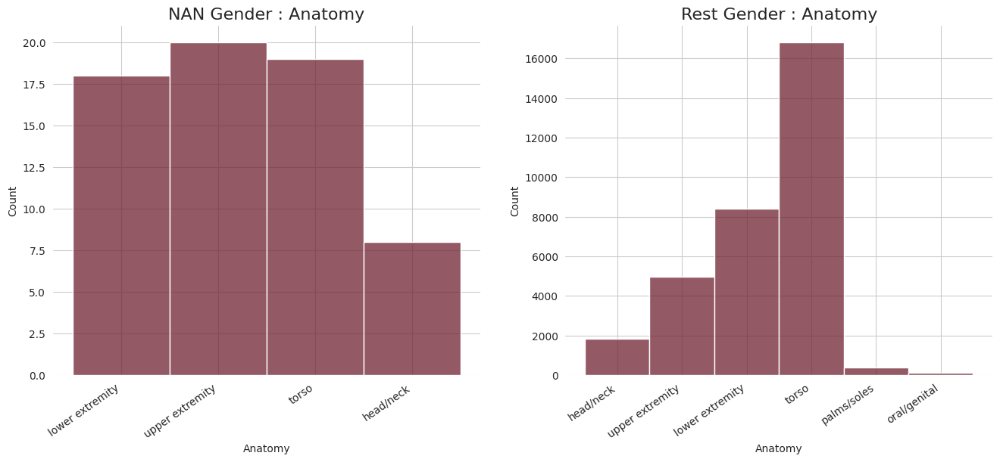

In [17]:
nan_sex = train_df[train_df['sex'].isna()]
is_sex = train_df[train_df['sex'].notna()]

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.histplot(nan_sex['Anatomy'], ax = ax1, color='#6F2232')
b = sns.histplot(is_sex['Anatomy'], ax = ax2, color='#6F2232')
ax1.set_title('NAN Gender : Anatomy', fontsize=16)
ax2.set_title('Rest Gender : Anatomy', fontsize=16)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

benign_count = nan_sex['is_malignant'].value_counts()[0]
print(f'Out of {len(nan_sex)} NAN values, {benign_count} are benign and {len(nan_sex) - benign_count} malignant.\n')

In [18]:
anatomy = ['lower extremity', 'upper extremity', 'torso']        # Most common anatomy accompanying NANs
train_df[(train_df['Anatomy'].isin(anatomy)) & (train_df['target'] == 0)]['sex'].value_counts()

train_df[train_df['target'] == 0]['sex'].value_counts()

sex
male      16716
female    15761
Name: count, dtype: int64

In [19]:
train_df['sex'].fillna("male", inplace = True)

Out of 68 NAN values, 68 are benign and 0 malignant.



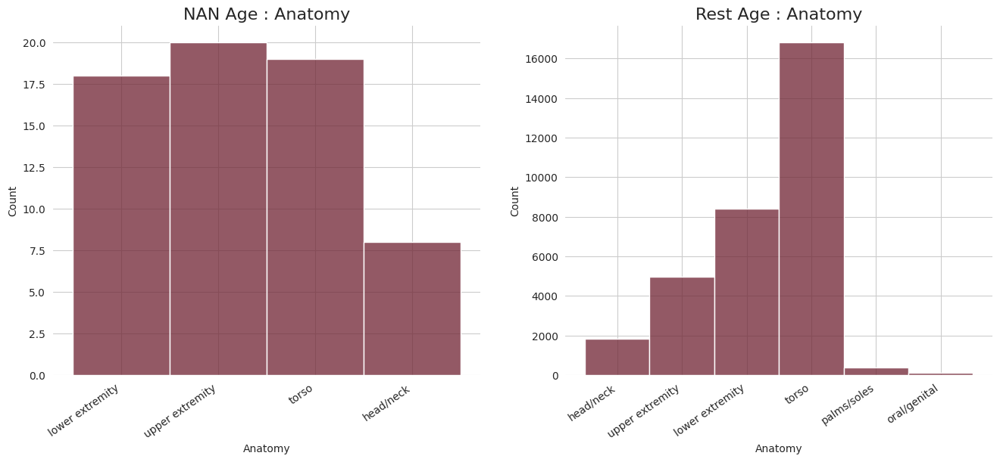

In [20]:
nan_age = train_df[train_df['Age'].isna()]
is_age = train_df[train_df['Age'].notna()]

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.histplot(nan_sex['Anatomy'], ax = ax1, color='#6F2232')
b = sns.histplot(is_sex['Anatomy'], ax = ax2, color='#6F2232')
ax1.set_title('NAN Age : Anatomy', fontsize=16)
ax2.set_title('Rest Age : Anatomy', fontsize=16)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

benign_count = nan_age['is_malignant'].value_counts()[0]
print(f'Out of {len(nan_age)} NAN values, {benign_count} are benign and {len(nan_age) - benign_count} malignant.\n')

In [21]:
anatomy = ['lower extremity', 'upper extremity', 'torso']
median = train_df[(train_df['Anatomy'].isin(anatomy)) & (train_df['target'] == 0) & (train_df['sex'] == 'male')]['Age'].median()
print('Median is:', median)

Median is: 50.0


In [22]:
train_df['Age'].fillna(median, inplace = True)

Out of 527 NAN values, 518 are benign and 9 malignant.



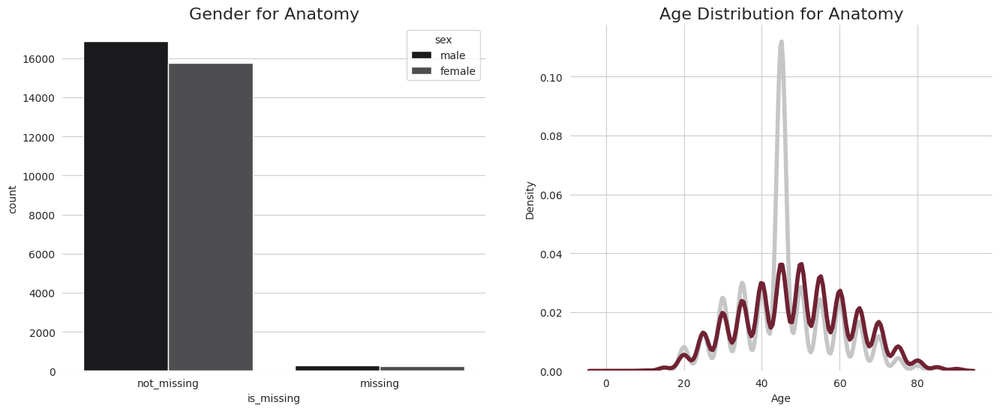

In [23]:
anatomy = train_df.copy()
anatomy['is_missing'] = np.where(train_df['Anatomy'].isna()==True, 'missing', 'not_missing')
nan_anatomy = anatomy[anatomy['is_missing'] == 'missing']
is_anatomy = anatomy[anatomy['is_missing'] != 'missing']

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

sns.countplot(x='is_missing', hue='sex', data=anatomy, palette=colors_nude, ax=ax1)

# Missing Anatomy Age Distribution in grey
sns.kdeplot(nan_anatomy['Age'],
            label='Missing', ax=ax2,
            color=colors_nude[2], linewidth=4, bw=0.1, fill=False)

# Not Missing Anatomy Age Distribution in dark red
sns.kdeplot(is_anatomy['Age'],
            label='Not Missing', ax=ax2,
            color=colors_nude[3], linewidth=4, bw=0.1, fill=False)

ax1.set_title('Gender for Anatomy', fontsize=16)
ax2.set_title('Age Distribution for Anatomy', fontsize=16)
sns.despine(left=True, bottom=True);

benign_count = nan_anatomy['is_malignant'].value_counts()[0]
print(f'Out of {len(nan_anatomy)} NAN values, {benign_count} are benign and {len(nan_anatomy) - benign_count} malignant.\n')

In [24]:
train_df['Anatomy'].fillna('torso', inplace = True)

## Handling Missing Data in Test Data

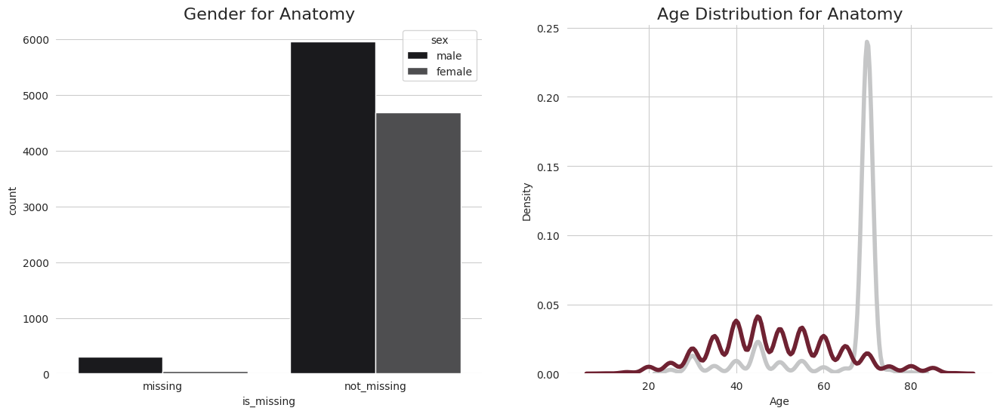

In [25]:
anatomy = test_df.copy()
anatomy['is_missing'] = np.where(test_df['Anatomy'].isna()==True, 'missing', 'not_missing')
nan_anatomy = anatomy[anatomy['is_missing'] == 'missing']
is_anatomy = anatomy[anatomy['is_missing'] != 'missing']

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

sns.countplot(x='is_missing', hue='sex', data=anatomy, palette=colors_nude, ax=ax1)

sns.kdeplot(nan_anatomy['Age'], label='Missing', ax=ax2, legend=True,
            color=colors_nude[2], linewidth=4, bw=0.1, fill=False)     # Missing Anatomy in grey

sns.kdeplot(is_anatomy['Age'], label='Not Missing', ax=ax2, legend=True,
            color=colors_nude[3], linewidth=4, bw=0.1, fill=False)     # Not Missing in dark red

ax1.set_title('Gender for Anatomy', fontsize=16)
ax2.set_title('Age Distribution for Anatomy', fontsize=16)
sns.despine(left=True, bottom=True);

In [26]:
test_df['Anatomy'].fillna('torso', inplace = True) 

# 4. EDA

## Train EDA

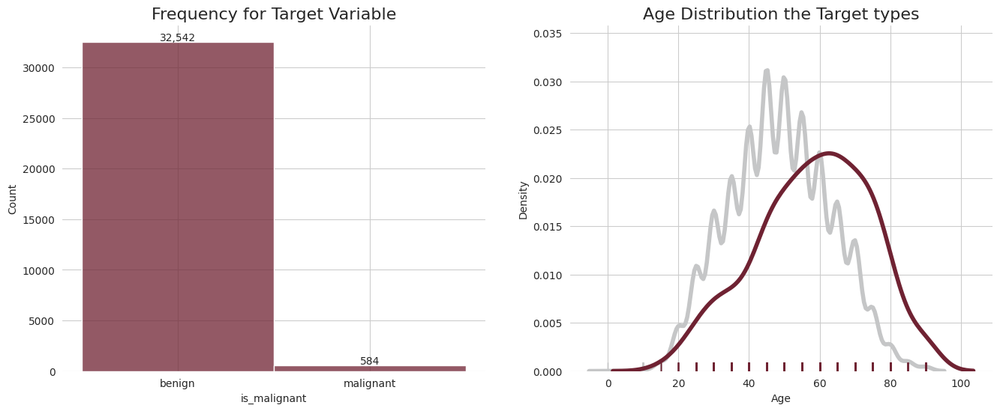

In [27]:
# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.histplot(train_df['is_malignant'], color=colors_nude[3], ax=ax1)

# Benign age distribution in grey
b = sns.distplot(a = train_df[train_df['target']==0]['Age'], ax=ax2, color=colors_nude[2], 
                 hist=False, rug=True, kde_kws=dict(linewidth=4), label='Benign')
# Malignant age distribution in dark red
c = sns.distplot(a = train_df[train_df['target']==1]['Age'], ax=ax2, color=colors_nude[3], 
                 hist=False, rug=True, kde_kws=dict(linewidth=4), label='Malignant')

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
ax1.set_title('Frequency for Target Variable', fontsize=16)
ax2.set_title('Age Distribution the Target types', fontsize=16)
sns.despine(left=True, bottom=True);

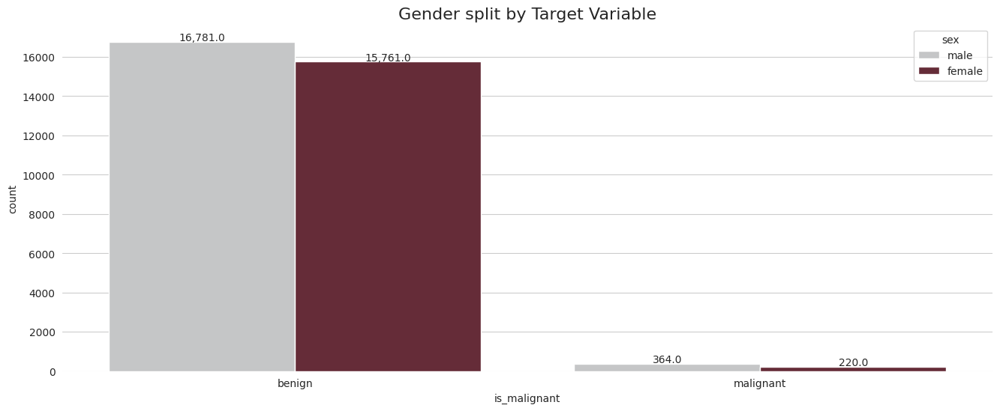

In [28]:
plt.figure(figsize=(16, 6))
a = sns.countplot(x='is_malignant', hue='sex', data=train_df, palette=colors_nude[2:4])

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')

plt.title('Gender split by Target Variable', fontsize=16)
sns.despine(left=True, bottom=True);

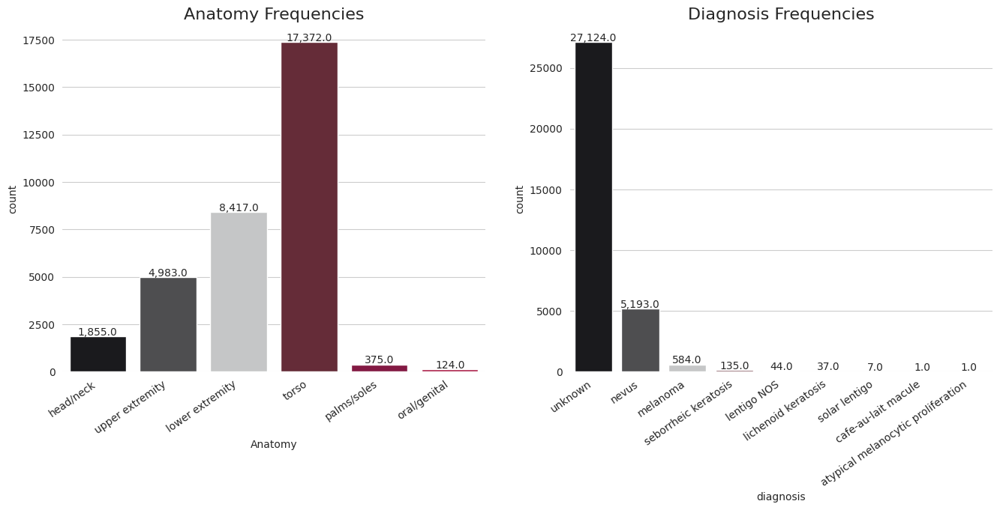

In [29]:
# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(x='Anatomy', data=train_df, ax=ax1, palette = colors_nude)
b = sns.countplot(x='diagnosis', data=train_df, ax=ax2, palette = colors_nude)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
for p in b.patches:
    b.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
ax1.set_title('Anatomy Frequencies', fontsize=16)
ax2.set_title('Diagnosis Frequencies', fontsize=16)
sns.despine(left=True, bottom=True);

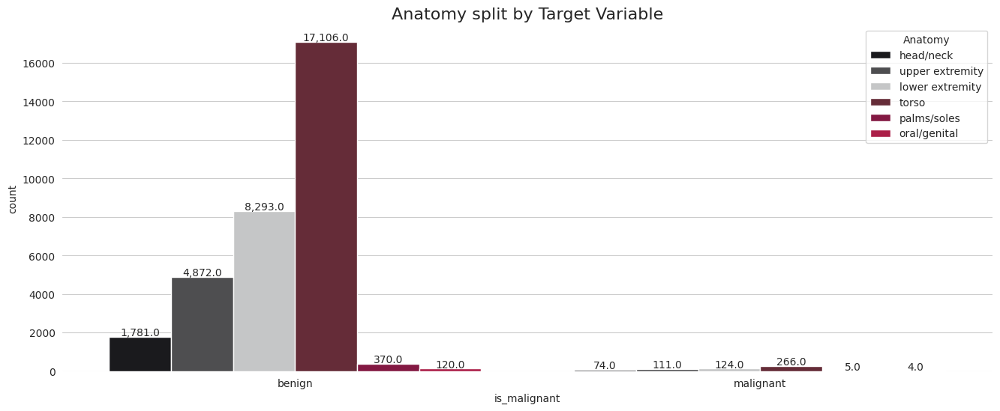

In [30]:
plt.figure(figsize=(16, 6))
a = sns.countplot(x='is_malignant', data=train_df, hue='Anatomy', palette=colors_nude)

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')

plt.title('Anatomy split by Target Variable', fontsize=16)
sns.despine(left=True, bottom=True);

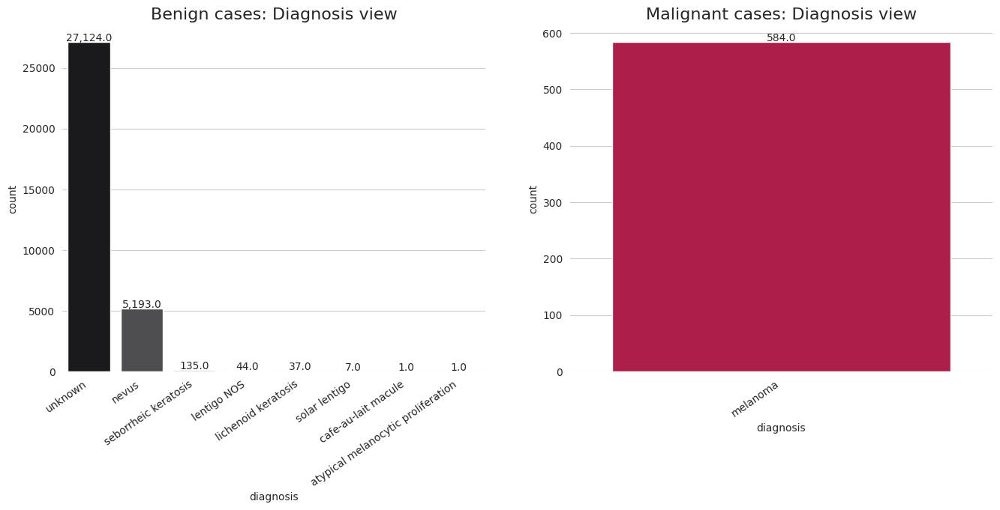

In [31]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(x='diagnosis',data=train_df[train_df['target']==0], ax=ax1, palette = colors_nude)
b = sns.countplot(x='diagnosis', ax=ax2, data=train_df[train_df['target']==1], palette = colors_nude[-1:])

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
for p in b.patches:
    b.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
ax1.set_title('Benign cases: Diagnosis view', fontsize=16)
ax2.set_title('Malignant cases: Diagnosis view', fontsize=16)
sns.despine(left=True, bottom=True);

## Test EDA

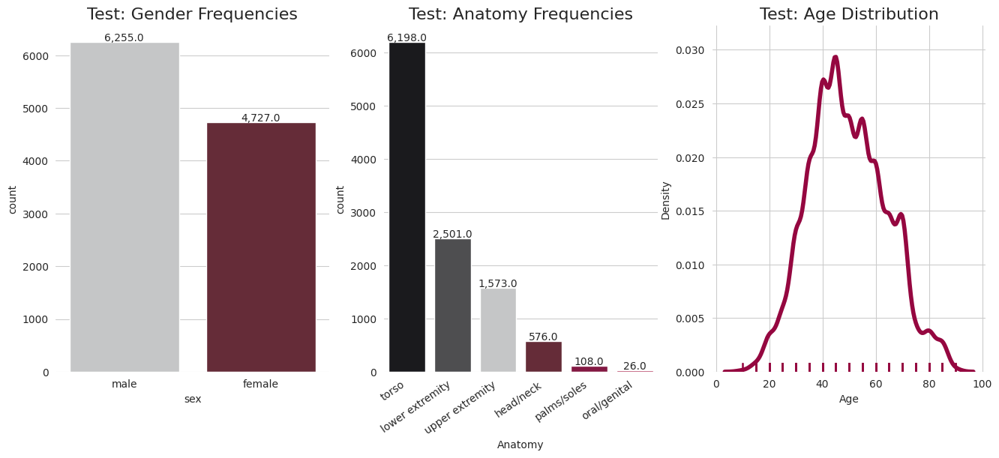

In [32]:
# Figure
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (16, 6))

a = sns.countplot(data=test_df, x='sex', palette=colors_nude[2:4], ax=ax1)
b = sns.countplot(data=test_df, x='Anatomy', ax=ax2, palette = colors_nude)
c = sns.distplot(a = test_df['Age'], ax=ax3, color=colors_nude[4], 
                 hist=False, rug=True, kde_kws=dict(linewidth=4))

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
for p in b.patches:
    b.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

ax1.set_title('Test: Gender Frequencies', fontsize=16)
ax2.set_title('Test: Anatomy Frequencies', fontsize=16)
ax3.set_title('Test: Age Distribution', fontsize=16)
sns.despine(left=True, bottom=True);

## Train and Test Distribution Comparison

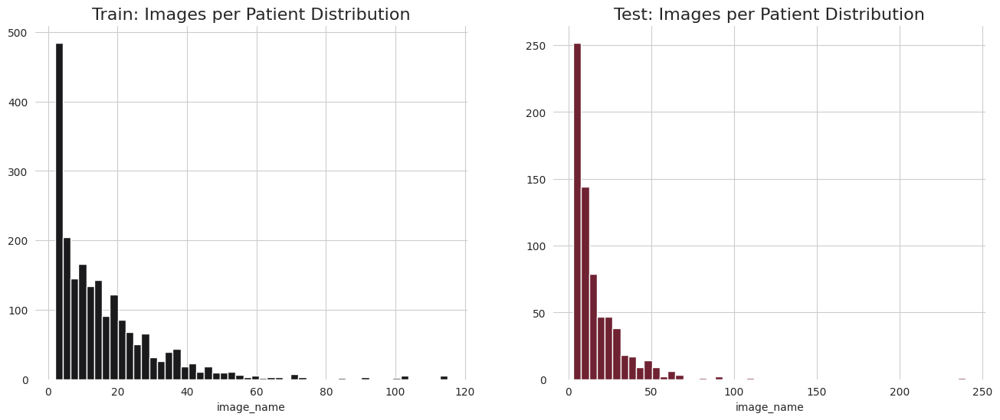

In [33]:
# Count the number of images per ID
patients_count_train = train_df.groupby(by='Id')['image_name'].count().reset_index()
patients_count_test = test_df.groupby(by='Id')['image_name'].count().reset_index()

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.distplot(patients_count_train['image_name'], kde=False, bins=50, 
                 ax=ax1, color=colors_nude[0], hist_kws={'alpha': 1})
b = sns.distplot(patients_count_test['image_name'], kde=False, bins=50, 
                 ax=ax2, color=colors_nude[3], hist_kws={'alpha': 1})
    
ax1.set_title('Train: Images per Patient Distribution', fontsize=16)
ax2.set_title('Test: Images per Patient Distribution', fontsize=16)
sns.despine(left=True, bottom=True);

# 5. Data Preprocessing

## Tabular Data

### Train Data Label Encoding

In [34]:
to_encode = ['sex', 'Anatomy', 'diagnosis']
encoded_all = []

label_encoder = LabelEncoder()

for column in to_encode:
    train_df[column] = label_encoder.fit_transform(train_df[column])

if 'is_malignant' in train_df.columns : train_df.drop(['is_malignant'], axis=1, inplace=True)

### Test Data Label Encoding

In [35]:
to_encode = ['sex', 'Anatomy']
encoded_all = []

label_encoder = LabelEncoder()

for column in to_encode:
    test_df[column] = label_encoder.fit_transform(test_df[column])

### One Hot Encoding Roman Training Data

In [36]:
roman_train

,image_name,Id,sex,Age,Anatomy,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,0
...,...,...,...,...,...,...
37643,ISIC_0073231,BCN_0005418,female,55.0,anterior torso,1
37644,ISIC_0073237,BCN_0001536,female,45.0,lower extremity,1
37645,ISIC_0073238,BCN_0005240,female,45.0,upper extremity,1
37646,ISIC_0073241,BCN_0004405,male,60.0,palms/soles,1


In [37]:
to_encode = ['sex', 'Anatomy']

label_encoder = LabelEncoder()

for column in to_encode:
    roman_train[column] = label_encoder.fit_transform(roman_train[column].astype(str))

## Images

### DICOM Images

#### Get Idea About Sizes

In [38]:
shapes_train = []

for k, path in enumerate(train_df['path_jpeg']):
    image = Image.open(path)
    shapes_train.append(image.size)
    
    if k >= 100: break
        
shapes_train = pd.DataFrame(data = shapes_train, columns = ['H', 'W'], dtype='object')
shapes_train['Size'] = '[' + shapes_train['H'].astype(str) + ', ' + shapes_train['W'].astype(str) + ']'

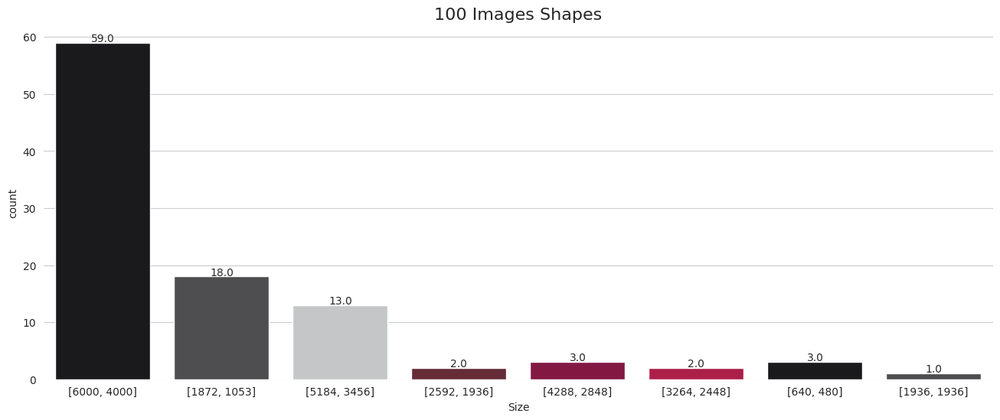

In [39]:
plt.figure(figsize = (16, 6))

a = sns.countplot(data=shapes_train, x='Size', palette=colors_nude)

for p in a.patches:
    a.annotate(format(p.get_height(), ','), 
           (p.get_x() + p.get_width() / 2., 
            p.get_height()), ha = 'center', va = 'center', 
           xytext = (0, 4), textcoords = 'offset points')
    
plt.title('100 Images Shapes', fontsize=16)
sns.despine(left=True, bottom=True);

#### Inspect Images

In [40]:
def show_images(data, n = 5, rows=1, cols=5, title='Default'):
    plt.figure(figsize=(16,4))

    for k, path in enumerate(data['path_dicom'][:n]):
        image = pydicom.dcmread(path)
        image = image.pixel_array
        
        # image = resize(image, (200, 200), anti_aliasing=True)

        plt.suptitle(title, fontsize = 16)
        plt.subplot(rows, cols, k+1)
        plt.imshow(image)
        plt.axis('off')

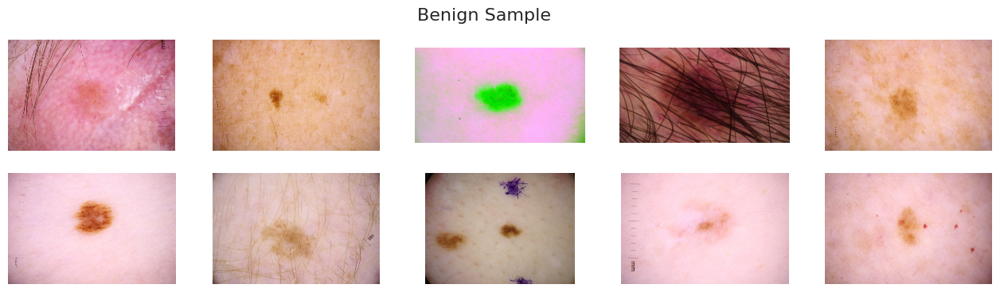

In [41]:
show_images(train_df[train_df['target'] == 0], n=10, rows=2, cols=5, title='Benign Sample')

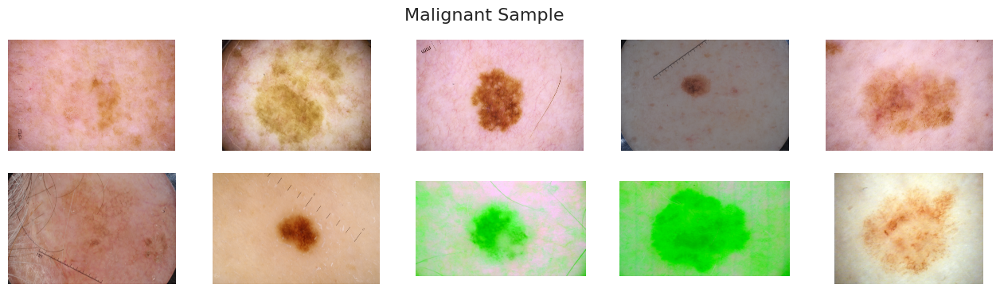

In [42]:
show_images(train_df[train_df['target'] == 1], n=10, rows=2, cols=5, title='Malignant Sample')

#### Greyscale Filter

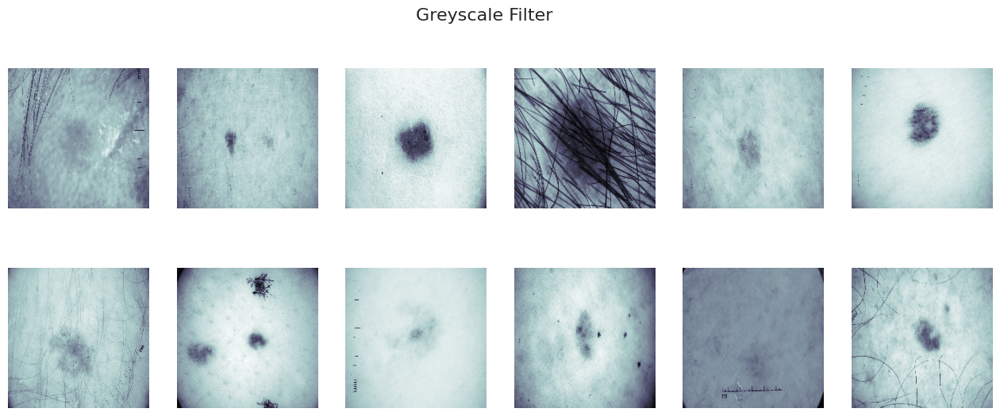

In [43]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("Greyscale Filter", fontsize = 16)

for i in range(0, 2*6):
    data = pydicom.dcmread(train_df['path_dicom'][i])
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')

#### Ben Graham Technique (Greyscale + Gaussian Blur)

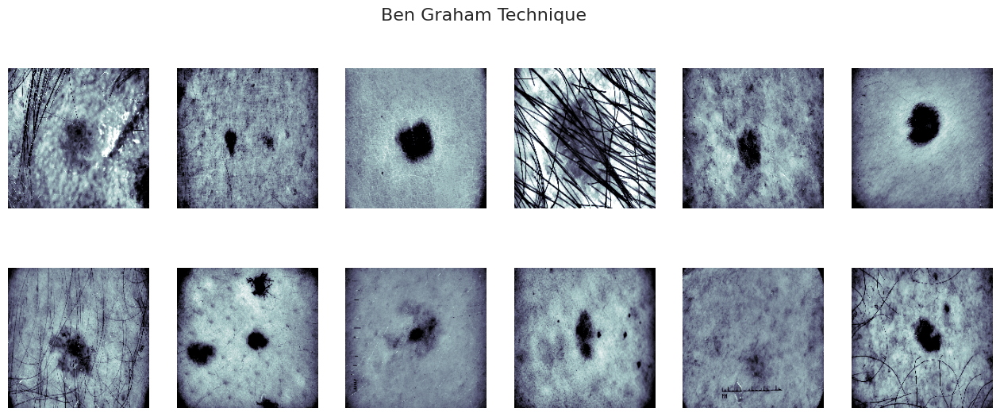

In [44]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("Ben Graham Technique", fontsize = 16)

for i in range(0, 2*6):
    data = pydicom.dcmread(train_df['path_dicom'][i])
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = cv2.resize(image, (200,200))
    image=cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0) ,256/10), -4, 128)
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')

#### HSV (Hue, Saturation, Value) Color Space

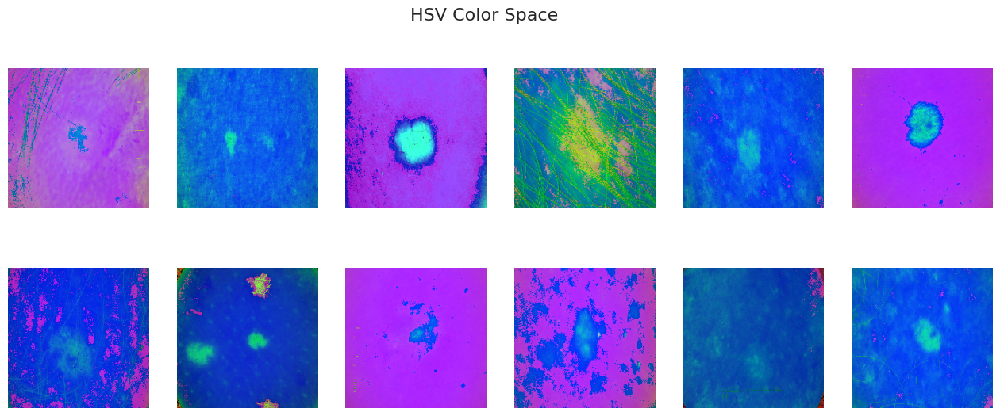

In [45]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("HSV Color Space", fontsize = 16)

for i in range(0, 2*6):
    data = pydicom.dcmread(train_df['path_dicom'][i])
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')

#### HLS (Hue, Lightness, Saturation) Color Space

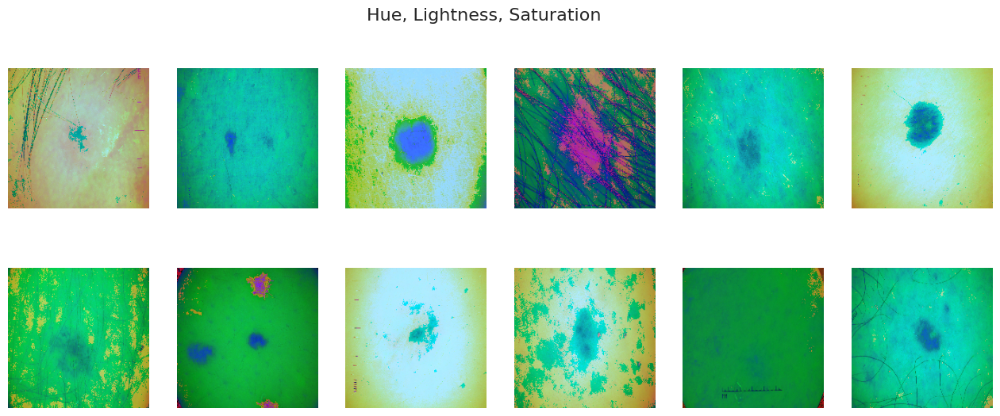

In [46]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("Hue, Lightness, Saturation", fontsize = 16)

for i in range(0, 2*6):
    data = pydicom.dcmread(train_df['path_dicom'][i])
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')

#### LUV (Lightness, UV) Color Space

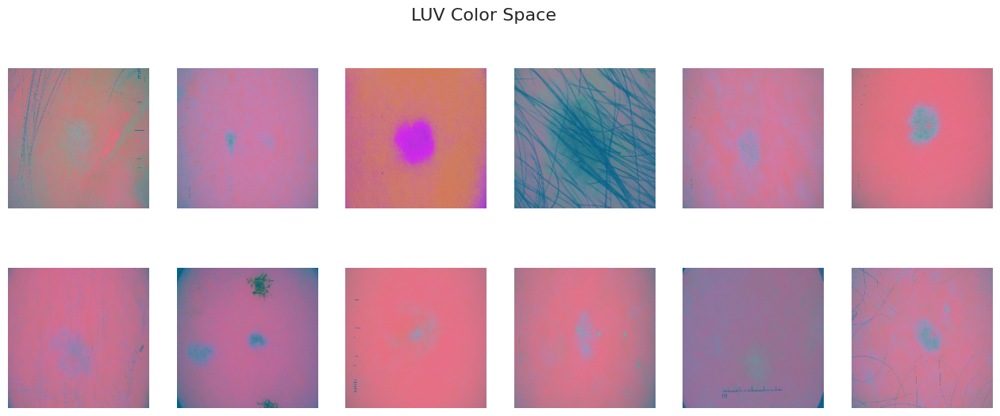

In [47]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
plt.suptitle("LUV Color Space", fontsize = 16)

for i in range(0, 2*6):
    data = pydicom.dcmread(train_df['path_dicom'][i])
    image = data.pixel_array
    
    # Transform to B&W
    # The function converts an input image from one color space to another.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    image = cv2.resize(image, (200,200))
    
    x = i // 6
    y = i % 6
    axes[x, y].imshow(image, cmap=plt.cm.bone) 
    axes[x, y].axis('off')

### JPEG Images

#### Torchvision Transform

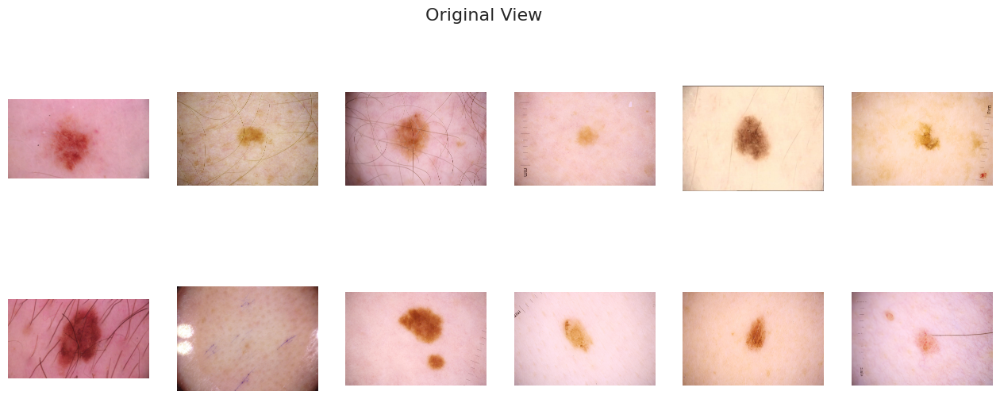

In [48]:
# Select a small sample of the .jpeg image paths
image_list = train_df.sample(12)['path_jpeg']
image_list = image_list.reset_index()['path_jpeg']

# Show the sample
plt.figure(figsize=(16,6))
plt.suptitle("Original View", fontsize = 16)
    
for k, path in enumerate(image_list):
    image = mpimg.imread(path)
        
    plt.subplot(2, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

In [49]:
# Create PyTorch Dataset Object
class DatasetExample(Dataset):
    def __init__(self, image_list, transforms=None):
        self.image_list = image_list
        self.transforms = transforms
    
    # To get item's length
    def __len__(self):
        return (len(self.image_list))
    
    # For indexing
    def __getitem__(self, i):
        # Read in image
        image = plt.imread(self.image_list[i])
        image = Image.fromarray(image).convert('RGB')        
        image = np.asarray(image).astype(np.uint8)
        if self.transforms is not None:
            image = self.transforms(image)
            
        return torch.tensor(image, dtype=torch.float)

In [50]:
# Predefined Show Images Function
def show_transform(image, title="Default"):
    plt.figure(figsize=(16,6))
    plt.suptitle(title, fontsize = 16)
    
    # Unnormalize
    image = image / 2 + 0.5  
    npimg = image.numpy()
    npimg = np.clip(npimg, 0., 1.)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

#### Crop Images

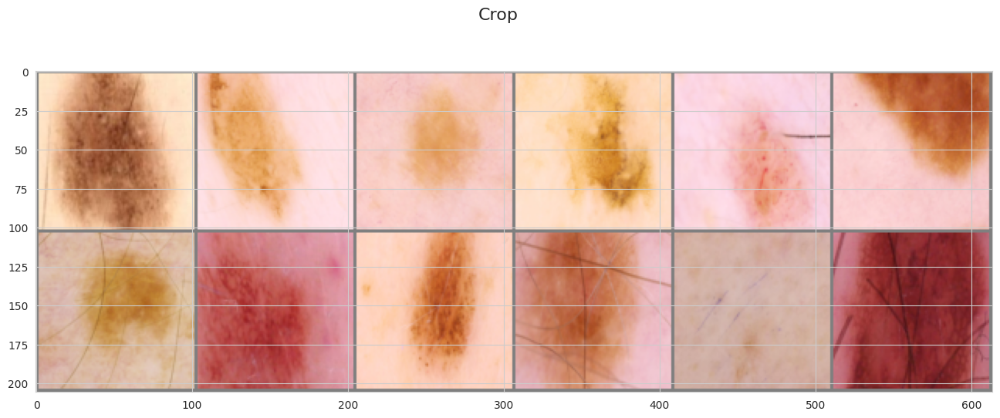

In [51]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((300, 300)),
     transforms.CenterCrop((100, 100)),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Crop")

#### ColorJitter (Randomly change the brightness, contrast and saturation of an image)

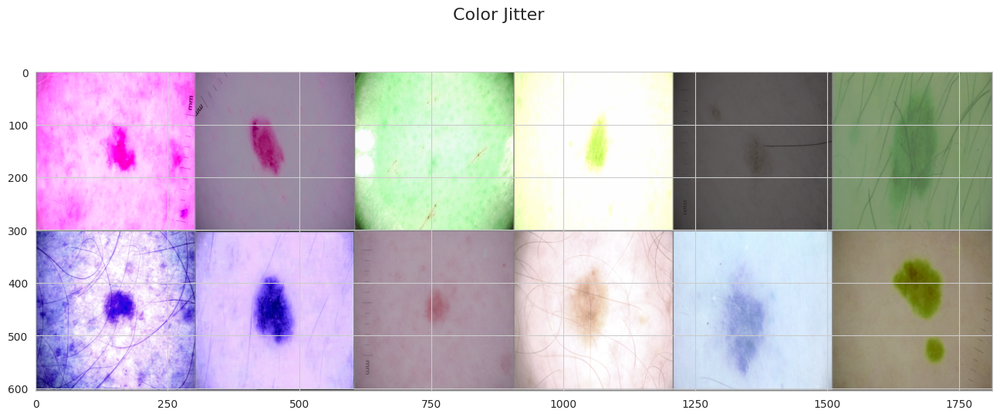

In [52]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((300, 300)),
     transforms.ColorJitter(brightness=0.7, contrast=0.7, saturation=0.7, hue=0.5),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Color Jitter")

#### Random Greyscale Filter

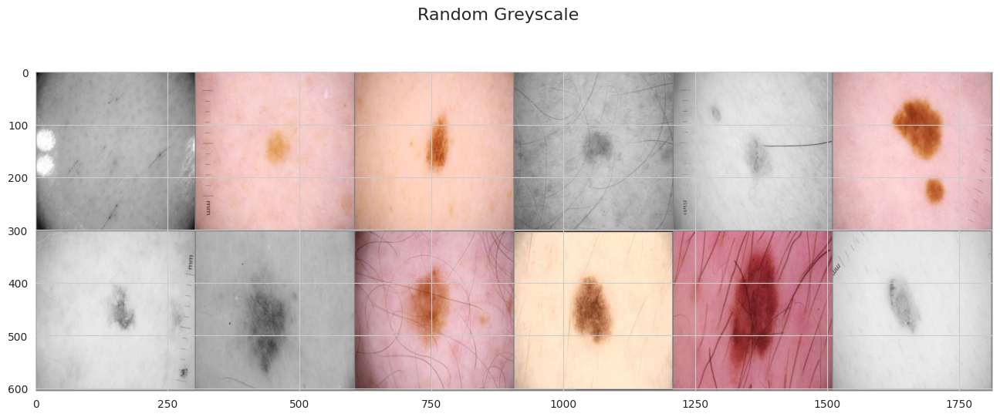

In [53]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((300, 300)),
     transforms.RandomGrayscale(p=0.7),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Random Greyscale")

#### Random Vertical Flip

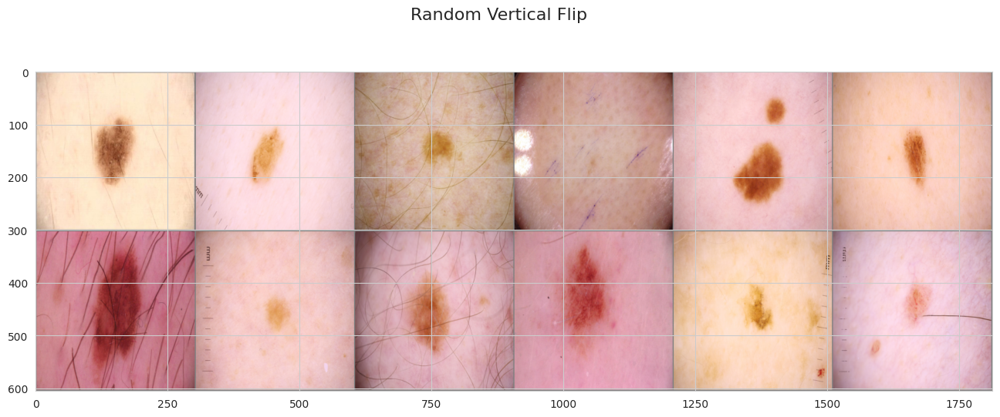

In [54]:
# Transform
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((300, 300)),
     transforms.RandomVerticalFlip(p=0.7),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

# Create the dataset
pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)

# Select the data
images = next(iter(pytorch_dataloader))
 
# show images
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Random Vertical Flip")

#### Hair Removal (Grayscale + MORPH_BLACKHAT + INPAINT_TRLEA)

In [55]:
def hair_remove(image):
    # convert image to grayScale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # kernel for morphologyEx
    kernel = cv2.getStructuringElement(1,(17,17))

    # apply MORPH_BLACKHAT to grayScale image
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)

    # apply thresholding to blackhat
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

    # inpaint with original image and threshold image
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)

    return final_image

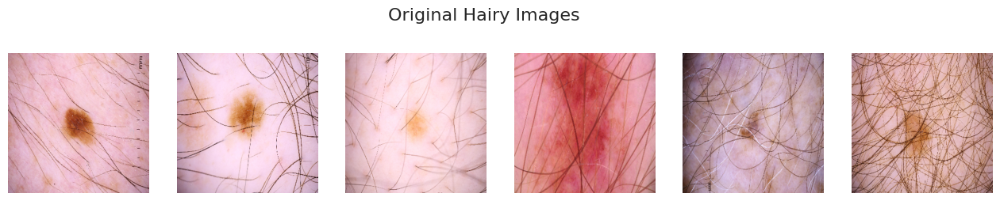

In [56]:
# Select a small sample of the .jpeg image paths
# We select some hairy photos on purpose
hairy_photos = train_df[train_df["sex"] == 1].reset_index().iloc[[12, 14, 17, 22, 33, 34]]
image_list = hairy_photos['path_jpeg']
image_list = image_list.reset_index()['path_jpeg']

# Show the Augmented Images
plt.figure(figsize=(16,3))
plt.suptitle("Original Hairy Images", fontsize = 16)
    
for k, path in enumerate(image_list):
    image = mpimg.imread(path)
    image = cv2.resize(image,(300, 300))
        
    plt.subplot(1, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

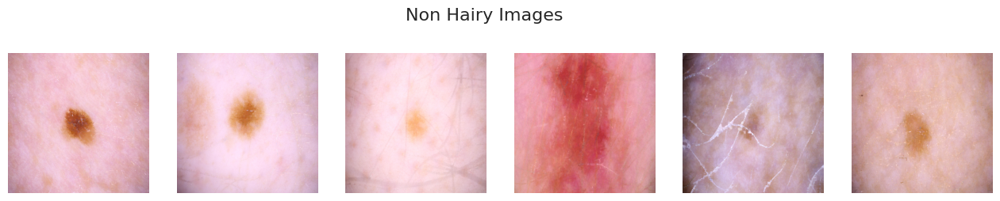

In [57]:
# Show the sample
plt.figure(figsize=(16,3))
plt.suptitle("Non Hairy Images", fontsize = 16)
    
for k, path in enumerate(image_list):
    image = mpimg.imread(path)
    image = cv2.resize(image,(300, 300))
    image = hair_remove(image)
        
    plt.subplot(1, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

# 6. Adding Malignant Data for Better Imabalance Ratio

In [58]:
my_train = train_df.drop(['path_dicom','path_jpeg'], axis=1)
my_train.drop(['diagnosis'], axis=1, inplace=True)
my_train

,image_name,Id,sex,Age,Anatomy,target
0,ISIC_2637011,IP_7279968,1,45.0,0,0
1,ISIC_0015719,IP_3075186,0,45.0,5,0
2,ISIC_0052212,IP_2842074,0,50.0,1,0
3,ISIC_0068279,IP_6890425,0,45.0,0,0
4,ISIC_0074268,IP_8723313,0,55.0,5,0
...,...,...,...,...,...,...
33121,ISIC_9999134,IP_6526534,1,50.0,4,0
33122,ISIC_9999320,IP_3650745,1,65.0,4,0
33123,ISIC_9999515,IP_2026598,1,20.0,1,0
33124,ISIC_9999666,IP_7702038,1,50.0,1,0


In [59]:
roman_train

,image_name,Id,sex,Age,Anatomy,target
0,ISIC_2637011,IP_7279968,1,45.0,1,0
1,ISIC_0015719,IP_3075186,0,45.0,9,0
2,ISIC_0052212,IP_2842074,0,50.0,3,0
3,ISIC_0068279,IP_6890425,0,45.0,1,0
4,ISIC_0074268,IP_8723313,0,55.0,9,0
...,...,...,...,...,...,...
37643,ISIC_0073231,BCN_0005418,0,55.0,0,1
37644,ISIC_0073237,BCN_0001536,0,45.0,3,1
37645,ISIC_0073238,BCN_0005240,0,45.0,9,1
37646,ISIC_0073241,BCN_0004405,1,60.0,6,1


## Concatenate Malignant Data for Better Imbalance Ratio

In [60]:
# --- Concatenate info which is not available in my_train ---
common_images = my_train['image_name'].unique()
new_data = roman_train[~roman_train['image_name'].isin(common_images)]

# Merge all together
train_df = pd.concat([my_train, new_data], axis=0)

In [61]:
test_df = test_df.drop(['path_dicom','path_jpeg'], axis=1)
test_df

,image_name,Id,sex,Age,Anatomy
0,ISIC_0052060,IP_3579794,1,70.0,4
1,ISIC_0052349,IP_7782715,1,40.0,1
2,ISIC_0058510,IP_7960270,0,55.0,4
3,ISIC_0073313,IP_6375035,0,50.0,4
4,ISIC_0073502,IP_0589375,0,45.0,1
...,...,...,...,...,...
10977,ISIC_9992485,IP_4152479,1,40.0,4
10978,ISIC_9996992,IP_4890115,1,35.0,4
10979,ISIC_9997917,IP_2852390,1,25.0,5
10980,ISIC_9998234,IP_8861963,1,65.0,1


## Create the New Image Paths

In [62]:
# Create path column to image folder for both Train and Test
path_train = '../input/melanoma-external-malignant-256/train/train/'
path_test = '../input/melanoma-external-malignant-256/test/test/'

train_df['path_jpg'] = path_train + train_df['image_name'] + '.jpg'
test_df['path_jpg'] = path_test + test_df['image_name'] + '.jpg'

## Fill Age Nulls

In [63]:
train_df['Age'] = train_df['Age'].fillna(-1)

## Min-Max Scaler (Normalization)

In [64]:
normalized_train = preprocessing.normalize(train_df[['sex', 'Age', 'Anatomy']])
normalized_test = preprocessing.normalize(test_df[['sex', 'Age', 'Anatomy']])

train_df['sex'] = normalized_train[:, 0]
train_df['Age'] = normalized_train[:, 1]
train_df['Anatomy'] = normalized_train[:, 2]

test_df['sex'] = normalized_test[:, 0]
test_df['Age'] = normalized_test[:, 1]
test_df['Anatomy'] = normalized_test[:, 2]

del normalized_train, normalized_test

### Read Images

In [65]:
def resize_image(image, x, y):
    # Convert image to OpenCV format (if necessary)
    if isinstance(image, np.ndarray):
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # Convert from RGB to BGR if needed

    # Resize the image
    resized_image = cv2.resize(image, (x,y))

    return resized_image

In [66]:
def ben_Graham(image):
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply Gaussian blur
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)  # Adjust kernel size and sigmaX as needed

    return blurred_image

In [67]:
def hair_remove(image):
    # convert image to grayScale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # kernel for morphologyEx
    kernel = cv2.getStructuringElement(1,(17,17))

    # apply MORPH_BLACKHAT to grayScale image
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)

    # apply thresholding to blackhat
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

    # inpaint with original image and threshold image
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)

    return final_image

In [68]:
def combined_preprocessing(image, x, y):
    
    image = hair_remove(image)
    image = ben_Graham(image)
    image = resize_image(image, x, y)

    return image

In [69]:
images=[]

for i in range (len(train_df)):
    image = Image.open(train_df['path_jpg'][i])
    image = np.array(image)
    image = combined_preprocessing(image, 128, 128)
    images.append(image)

In [70]:
images = np.array(images)
images = np.stack(images, axis=0)
target_reshaped = train_df['target'].to_numpy()
target_reshaped = np.stack(target_reshaped, axis=0)

In [71]:
images, x_val, target_reshaped, y_val = train_test_split(images, target_reshaped, test_size=0.2, random_state=42, stratify=target_reshaped)

In [72]:
data_aug = ImageDataGenerator(horizontal_flip=0.5,
                             vertical_flip=0.5,
                             brightness_range=[0.7, 1.3],
                             rescale=1./255,
                             fill_mode='nearest')

train_generator = data_aug.flow(images, target_reshaped, batch_size=32)

# 8. Modelling

## ResNet50V2 Model

In [73]:
resnet50v2 = ResNet50V2(include_top=True,
                        weights=None,
                        input_tensor=None,
                        input_shape=(128, 128, 3),
                        pooling=None,
                        classes=2,
                        classifier_activation="sigmoid")

resnet50v2.name = "resnet50v2"

In [74]:
resnet50v2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
resnet50v2.summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 134, 134,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 66, 66,    │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 32, 32,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 32, 32,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 32, 32,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 34, 34,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 32, 32,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 32, 32,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 32, 32,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 32, 32,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 32, 32,    │          0 │ conv2_block1_0_c

 Total params: 23,568,898 (89.91 MB)

 Trainable params: 23,523,458 (89.73 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [75]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [76]:
history = resnet50v2.fit(train_generator, epochs=15, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/15


I0000 00:00:1737801466.644288      84 service.cc:145] XLA service 0x7c7b60009ea0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1737801466.644360      84 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1737801466.644365      84 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  1/942 ━━━━━━━━━━━━━━━━━━━━ 11:03:05 42s/step - accuracy: 0.1250 - loss: 1.6167

I0000 00:00:1737801486.587161      84 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


942/942 ━━━━━━━━━━━━━━━━━━━━ 161s 126ms/step - accuracy: 0.8910 - loss: 0.3155 - val_accuracy: 0.1356 - val_loss: 7624.0493
Epoch 2/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 103s 109ms/step - accuracy: 0.9121 - loss: 0.2411 - val_accuracy: 0.8584 - val_loss: 52.5430
Epoch 3/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 103s 109ms/step - accuracy: 0.9141 - loss: 0.2359 - val_accuracy: 0.1356 - val_loss: 996.3787
Epoch 4/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 103s 109ms/step - accuracy: 0.9157 - loss: 0.2320 - val_accuracy: 0.1349 - val_loss: 589.8136
Epoch 5/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 103s 109ms/step - accuracy: 0.9162 - loss: 0.2226 - val_accuracy: 0.1356 - val_loss: 1934.4670
Epoch 6/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 103s 109ms/step - accuracy: 0.9208 - loss: 0.2159 - val_accuracy: 0.1356 - val_loss: 2821.8506
Epoch 7/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 103s 109ms/step - accuracy: 0.9197 - loss: 0.2139 - val_accuracy: 0.1356 - val_loss: 1790.7291


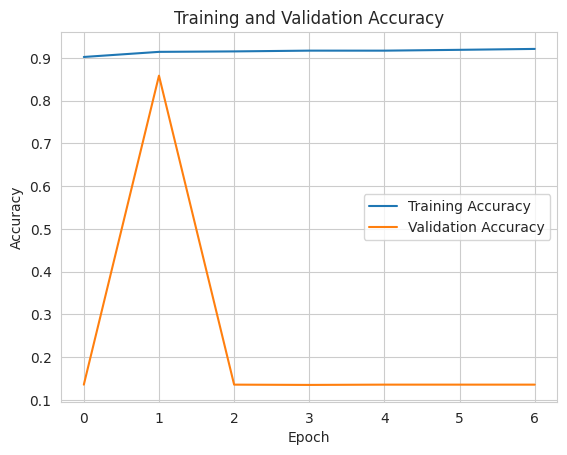

In [77]:
train_acc1 = history.history['accuracy']
val_acc1 = history.history['val_accuracy']

# Plot the training and validation accuracies
plt.plot(train_acc1, label='Training Accuracy')
plt.plot(val_acc1, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [78]:
resnet50v2.save('my_model.h5')

## ResNet152V2 Model

In [79]:
resnet152v2 = ResNet152V2(include_top=True,
                        weights=None,
                        input_tensor=None,
                        input_shape=(128, 128, 3),
                        pooling=None,
                        classes=2,
                        classifier_activation="sigmoid")

resnet152v2.name = "resnet152v2"

In [80]:
resnet152v2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
resnet152v2.summary()

Model: "resnet152v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 134, 134,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 66, 66,    │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 32, 32,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 32, 32,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 32, 32,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 34, 34,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 32, 32,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 32, 32,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 32, 32,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 32, 32,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 32, 32,    │          0 │ conv2_block1_0_c

 Total params: 58,335,746 (222.53 MB)

 Trainable params: 58,192,002 (221.98 MB)

 Non-trainable params: 143,744 (561.50 KB)

In [81]:
history = resnet152v2.fit(train_generator, epochs=15, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/15


I0000 00:00:1737802349.994857      83 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_64', 40 bytes spill stores, 40 bytes spill loads



163/942 ━━━━━━━━━━━━━━━━━━━━ 3:34 275ms/step - accuracy: 0.8574 - loss: 0.4781

I0000 00:00:1737802437.187498      83 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_62', 40 bytes spill stores, 40 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_85', 40 bytes spill stores, 40 bytes spill loads



942/942 ━━━━━━━━━━━━━━━━━━━━ 450s 355ms/step - accuracy: 0.8838 - loss: 0.3493 - val_accuracy: 0.1356 - val_loss: 1444.4634
Epoch 2/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 280s 297ms/step - accuracy: 0.9141 - loss: 0.2417 - val_accuracy: 0.1356 - val_loss: 1402.9111
Epoch 3/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 279s 296ms/step - accuracy: 0.9131 - loss: 0.2454 - val_accuracy: 0.1356 - val_loss: 558.2667
Epoch 4/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 278s 295ms/step - accuracy: 0.9182 - loss: 0.2236 - val_accuracy: 0.1356 - val_loss: 1038.1898
Epoch 5/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 278s 295ms/step - accuracy: 0.9188 - loss: 0.2254 - val_accuracy: 0.1356 - val_loss: 1202.0317


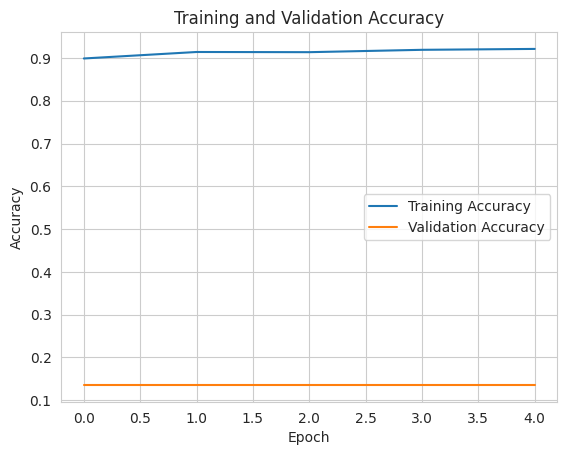

In [82]:
train_acc1 = history.history['accuracy']
val_acc1 = history.history['val_accuracy']

# Plot the training and validation accuracies
plt.plot(train_acc1, label='Training Accuracy')
plt.plot(val_acc1, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [83]:
# images=[]

# for i in range (len(test_df)):
#     image = Image.open(test_df['path_jpg'][i])
#     image = np.array(image)
#     image = resize_image(image)
#     images.append(image)

In [84]:
# images = np.array(images)
# images = np.stack(images, axis=0)
# target_reshaped = test_df['target'].to_numpy()
# target_reshaped = np.stack(target_reshaped, axis=0)

## EfficientNetB7

In [85]:
efficientnetb7 = keras.applications.EfficientNetB7(include_top=True,
                                                   weights=None,
                                                   input_tensor=None,
                                                   input_shape=(128, 128, 3),
                                                   pooling=None,
                                                   classes=2,
                                                   classifier_activation="sigmoid")

efficientnetb7.name = 'efficientnetb7'

In [86]:
efficientnetb7.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
efficientnetb7.summary()

Model: "efficientnetb7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 128, 128,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 128, 128,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 129, 129,  │          0 │ normalization[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 64, 64,    │      1,728 │ stem_conv_pad[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 64, 64,    │        256 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 64, 64,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 64, 64,    │        576 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 64, 64,    │        256 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 64, 64,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 64)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 64)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 16)  │      1,040 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 64)  │      1,088 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 64, 64,    │          0 │ block1a_activati… │
│ (Multiply)          │ 64)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 64, 64,    │      2,048 │ block1a_se_excit… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 64, 64,    │        128 │ block1a_project_

 Total params: 64,102,809 (244.53 MB)

 Trainable params: 63,792,082 (243.35 MB)

 Non-trainable params: 310,727 (1.19 MB)

In [87]:
history = efficientnetb7.fit(train_generator, epochs=15, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/15


I0000 00:00:1737804174.000930      82 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_12', 24 bytes spill stores, 24 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_11', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_10', 36 bytes spill stores, 36 bytes spill loads



942/942 ━━━━━━━━━━━━━━━━━━━━ 939s 616ms/step - accuracy: 0.8295 - loss: 2.2146 - val_accuracy: 0.8644 - val_loss: 64683.9453
Epoch 2/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 344s 365ms/step - accuracy: 0.8669 - loss: 0.6285 - val_accuracy: 0.8644 - val_loss: 36.2896
Epoch 3/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 344s 365ms/step - accuracy: 0.8591 - loss: 0.5890 - val_accuracy: 0.8644 - val_loss: 269.3923
Epoch 4/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 344s 365ms/step - accuracy: 0.8630 - loss: 0.4073 - val_accuracy: 0.8644 - val_loss: 567.7741
Epoch 5/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 343s 364ms/step - accuracy: 0.8641 - loss: 0.4127 - val_accuracy: 0.8644 - val_loss: 5269.3003
Epoch 6/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 344s 365ms/step - accuracy: 0.8645 - loss: 0.4568 - val_accuracy: 0.8644 - val_loss: 205.3523
Epoch 7/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 343s 364ms/step - accuracy: 0.8975 - loss: 0.3097 - val_accuracy: 0.8644 - val_loss: 96.2538


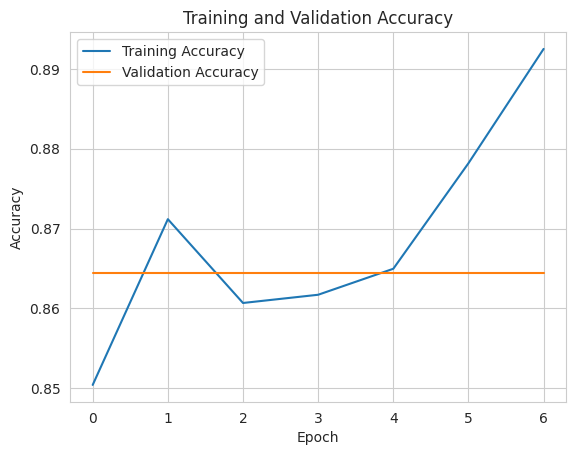

In [88]:
train_acc1 = history.history['accuracy']
val_acc1 = history.history['val_accuracy']

# Plot the training and validation accuracies
plt.plot(train_acc1, label='Training Accuracy')
plt.plot(val_acc1, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [89]:
efficientnetb7.save('melanoma.efficientnetb7.h5')

In [90]:
import pickle

with open("melanoma.efficientnetb7.pkl", 'wb') as file:  
    pickle.dump(efficientnetb7, file)

## VGGNet19

In [91]:
vgg19 = keras.applications.VGG19(include_top=True,
                                 weights=None,
                                 input_tensor=None,
                                 input_shape=(128, 128, 3),
                                 pooling=None,
                                 classes=2,
                                 classifier_activation="sigmoid")

vgg19.name="vgg19"

In [92]:
vgg19.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
vgg19.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │    33,558,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,31

 Total params: 70,372,418 (268.45 MB)

 Trainable params: 70,372,418 (268.45 MB)

 Non-trainable params: 0 (0.00 B)

In [93]:
history = vgg19.fit(train_generator, epochs=15, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 223s 206ms/step - accuracy: 0.8550 - loss: 0.4366 - val_accuracy: 0.8644 - val_loss: 0.4008
Epoch 2/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.8636 - loss: 0.4007 - val_accuracy: 0.8644 - val_loss: 0.3969
Epoch 3/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.8658 - loss: 0.3958 - val_accuracy: 0.8644 - val_loss: 0.3969
Epoch 4/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 177s 188ms/step - accuracy: 0.8631 - loss: 0.4003 - val_accuracy: 0.8644 - val_loss: 0.3976
Epoch 5/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 177s 188ms/step - accuracy: 0.8654 - loss: 0.3964 - val_accuracy: 0.8644 - val_loss: 0.3979
Epoch 6/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.8681 - loss: 0.3914 - val_accuracy: 0.8644 - val_loss: 0.3969
Epoch 7/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.8634 - loss: 0.3996 - val_accuracy: 0.8644 - val_loss: 0.3971
Epoch 8/15
942/942 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.8635 -

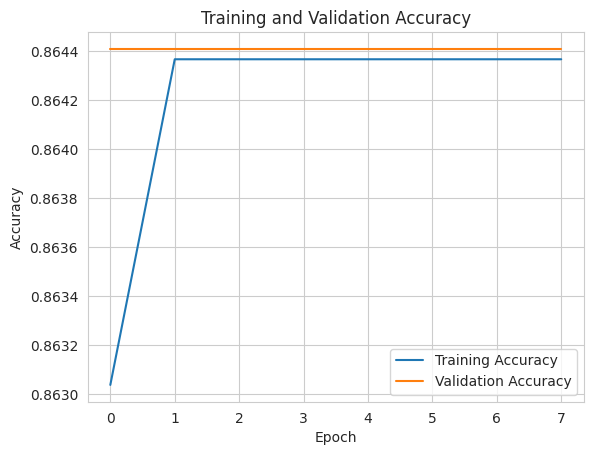

In [94]:
train_acc1 = history.history['accuracy']
val_acc1 = history.history['val_accuracy']

# Plot the training and validation accuracies
plt.plot(train_acc1, label='Training Accuracy')
plt.plot(val_acc1, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [95]:
import pickle

with open("melanoma.vgg19.pkl", 'wb') as file:  
    pickle.dump(vgg19, file)